<a href="https://colab.research.google.com/github/Sim-mi-gyeong/ProbonoICT/blob/main/text_detection_with_CRAFT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Create New API Token 을 클릭 -> 토큰 파일 다운 -> 해당 파일은 json 파일

In [ ]:
#  Token 파일 업로드
!pip install kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"simmigyeong","key":"deecca92c74d3349b0c44804ce4a24b2"}'}

In [ ]:
ls -1ha kaggle.json

kaggle.json


In [ ]:
cp kaggle.json ~/.kaggle/kaggle.json

cp: cannot create regular file '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
# chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle competitions list

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python2.7/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python2.7/dist-packages/kaggle/api/kaggle_api_extended.py", line 146, in authenticate
    self.config_file, self.config_dir))
IOError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


In [ ]:
from google.colab import drive # 패키지 불러오기 

ROOT = "/content/drive"     # 드라이브 기본 경로
print(ROOT)                 # print content of ROOT (Optional)
drive.mount(ROOT)           # 드라이브 기본 경로 Mount

/content/drive
Mounted at /content/drive


In [ ]:
from os.path import join  

MY_GOOGLE_DRIVE_PATH = 'My Drive/Colab Notebooks/kaggle/data'
PROJECT_PATH = join(ROOT, MY_GOOGLE_DRIVE_PATH)
print(PROJECT_PATH)

/content/drive/My Drive/Colab Notebooks/kaggle/data


In [ ]:
%cd '/content/drive/My Drive/Colab Notebooks/kaggle/data'

/content/drive/My Drive/Colab Notebooks/kaggle/data


In [ ]:
import os

In [ ]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
# 인증키 복사하기
# -> 업로드된 인증키를 정해진 곳에 넣어줘야함.(json 파일 이동시키기)
# -> kaggle을 위한 디렉토리 생성

!ls -al

!mkdir -p ~/.kaggle

!ls -al ~/

total 77737
-rw------- 1 root root 77254523 Sep 14 17:36 craft-pretrained-model.zip
drwx------ 2 root root     4096 Sep 14 17:25 CRAFT-pytorch
-rw------- 1 root root  1128144 Sep 14 18:27 craft-test-images.zip
-rw------- 1 root root       67 Sep 14 17:21 kaggle.json
-rw------- 1 root root     8503 Mar 29 08:16 test10.jpg
-rw------- 1 root root     9349 Mar 29 08:16 test11.png
-rw------- 1 root root    64663 Mar 29 08:16 test12.jpg
-rw------- 1 root root    26267 Mar 29 08:16 test13.jpg
-rw------- 1 root root   133203 Mar 29 08:16 test14.jpg
-rw------- 1 root root     9619 Mar 29 08:16 test15.jpeg
-rw------- 1 root root    37764 Mar 29 08:16 test16.jpg
-rw------- 1 root root    25786 Mar 29 08:16 test17.png
-rw------- 1 root root    23847 Mar 29 08:16 test18.jpg
-rw------- 1 root root    89485 Mar 29 08:16 test1.jpg
-rw------- 1 root root   103156 Mar 29 08:16 test2.jpg
-rw------- 1 root root    41484 Mar 29 08:16 test3.jpg
-rw------- 1 root root   217814 Mar 29 08:16 test4.jpg
-rw-----

In [ ]:
# 인증키를 복사한 뒤 속성 변경

!cp kaggle.json ~/.kaggle/kaggle.json

!chmod 600 ~/.kaggle/kaggle.json

!ls -al ~/.kaggle/

total 16
drwxr-xr-x 2 root root 4096 Sep 18 03:15 .
drwx------ 1 root root 4096 Sep 18 03:14 ..
-rw------- 1 root root   67 Sep 18 03:15 kaggle.json


In [ ]:
!git clone https://github.com/clovaai/CRAFT-pytorch

fatal: destination path 'CRAFT-pytorch' already exists and is not an empty directory.


In [ ]:
# ls /kaggle/input

ls: cannot access '/kaggle/input': No such file or directory


In [ ]:
# OCR 구성

# 1. 문자 탐지
# 2. 문자 인식
# 텍스트 감지는 다음 두 가지 방법을 사용하여 구현할 수 있음.

# 1. 영역 기반 디텍터(R-FCN, 고속 R-CNN과 같은 지역 기반 탐지 기반 방법)
# 2. 싱글샷 검출기(SSD, YOLO와 같은 싱글샷 검출 기본 방법)

# While tesseract, deep-text-recognition can be used for text recognition.

In [ ]:
# Kaggle 사이트에서 Dataset -> 다운로드를 받을 수 있는 API를 확인

In [ ]:
!kaggle datasets download -d ajeetverma/craft-pretrained-model

craft-pretrained-model.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!kaggle datasets download -d ajeetverma/craft-test-images

  0% 0.00/1.08M [00:00<?, ?B/s]
100% 1.08M/1.08M [00:00<00:00, 35.4MB/s]


In [ ]:
!ls

craft-pretrained-model.zip  test11.png	 test16.jpg  test3.jpg	test9.jpg
CRAFT-pytorch		    test12.jpg	 test17.png  test4.jpg
craft-test-images.zip	    test13.jpg	 test18.jpg  test6.jpg
kaggle.json		    test14.jpg	 test1.jpg   test7.jpg
test10.jpg		    test15.jpeg  test2.jpg   test8.jpg


In [ ]:
# 데이터 압축 풀기
# !unzip craft-pretrained-model.zip

Archive:  craft-pretrained-model.zip
  inflating: craft_ic15_20k.pth      


In [ ]:
# !unzip craft-test-images.zip 

Archive:  craft-test-images.zip
  inflating: test1.jpg               
  inflating: test10.jpg              
  inflating: test11.png              
  inflating: test12.jpg              
  inflating: test13.jpg              
  inflating: test14.jpg              
  inflating: test15.jpeg             
  inflating: test16.jpg              
  inflating: test17.png              
  inflating: test18.jpg              
  inflating: test2.jpg               
  inflating: test3.jpg               
  inflating: test4.jpg               
  inflating: test6.jpg               
  inflating: test7.jpg               
  inflating: test8.jpg               
  inflating: test9.jpg               


In [ ]:
cd CRAFT-pytorch/

/content/drive/My Drive/Colab Notebooks/kaggle/data/CRAFT-pytorch


In [ ]:
ls

basenet/                 craft_utils.py  LICENSE       requirements.txt
craft-pretrained-model/  figures/        __pycache__/  result/
craft.py                 file_utils.py   README.md     test.py
craft-test-images/       imgproc.py      refinenet.py


In [ ]:
cd craft-test-images

/content/drive/My Drive/Colab Notebooks/kaggle/data/CRAFT-pytorch/craft-test-images


In [ ]:
!unzip craft-test-images.zip

Archive:  craft-test-images.zip
  inflating: test1.jpg               
  inflating: test10.jpg              
  inflating: test11.png              
  inflating: test12.jpg              
  inflating: test13.jpg              
  inflating: test14.jpg              
  inflating: test15.jpeg             
  inflating: test16.jpg              
  inflating: test17.png              
  inflating: test18.jpg              
  inflating: test2.jpg               
  inflating: test3.jpg               
  inflating: test4.jpg               
  inflating: test6.jpg               
  inflating: test7.jpg               
  inflating: test8.jpg               
  inflating: test9.jpg               


In [ ]:
cd ..

/content/drive/My Drive/Colab Notebooks/kaggle/data/CRAFT-pytorch


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [ ]:
import torch
import torch.nn as nn

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
# model = Net()
# model.load_state_dict(torch.load(weights_paths, map_location=device))
# # Or you can move the loaded model into the specific device
# model.to(device)

In [ ]:
!python3 test.py --trained_model=craft-pretrained-model/craft_ic15_20k.pth --test_folder=craft-test-images

Loading weights from checkpoint (craft-pretrained-model/craft_ic15_20k.pth)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
elapsed time : 113.25385761260986s


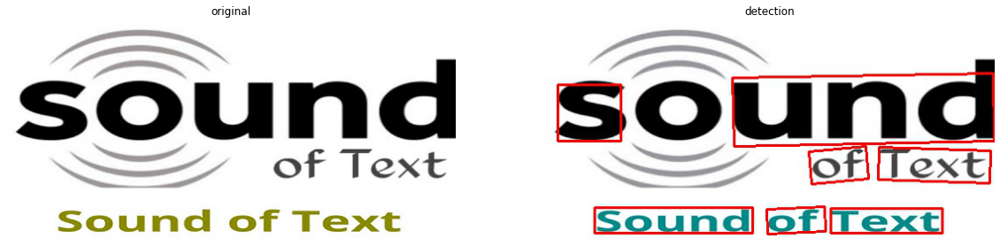

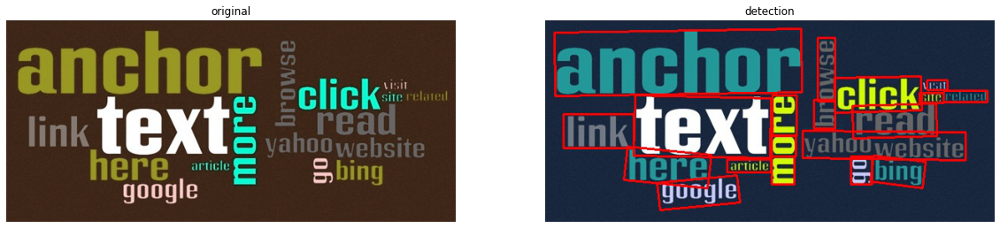

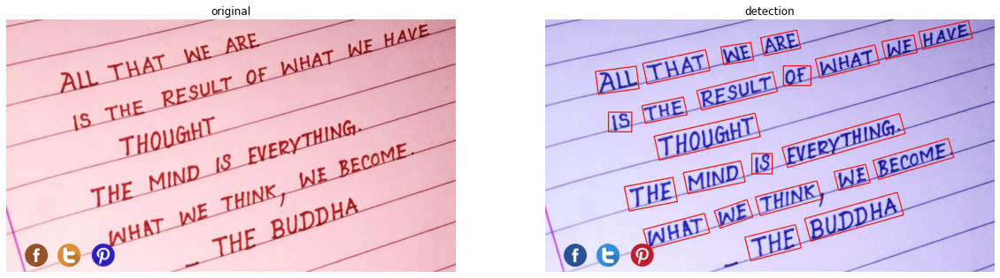

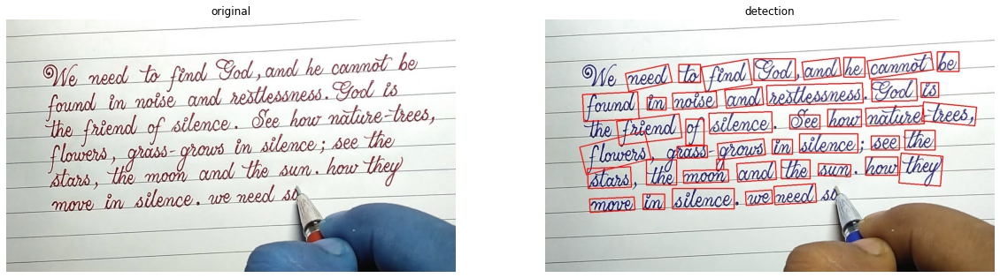

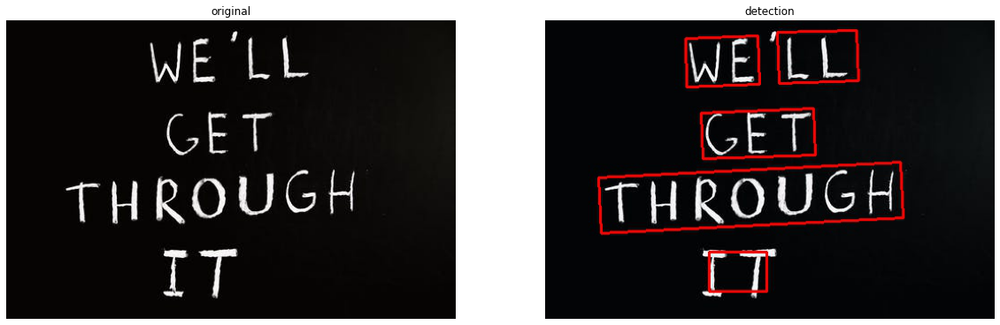

...

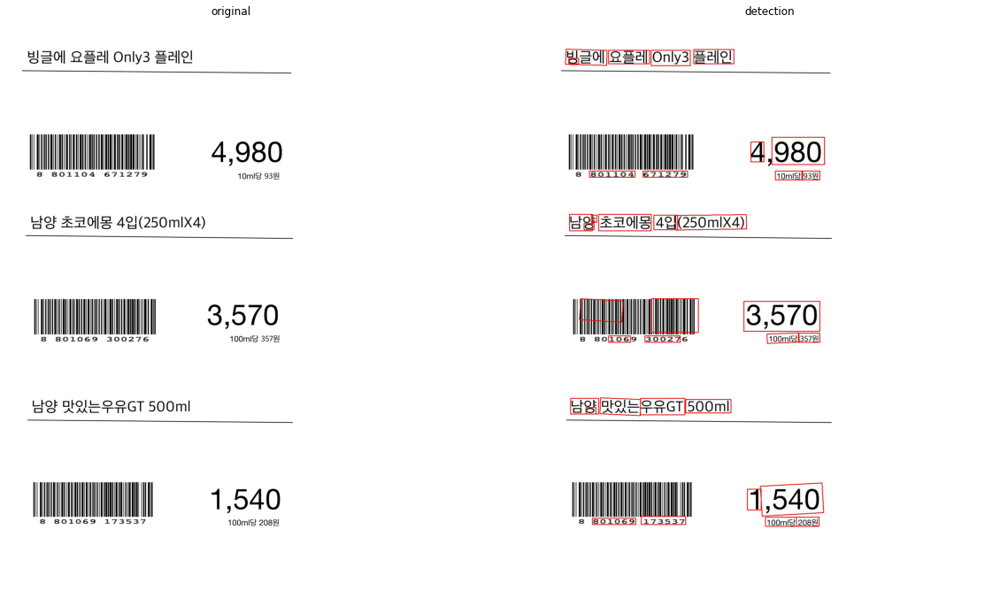

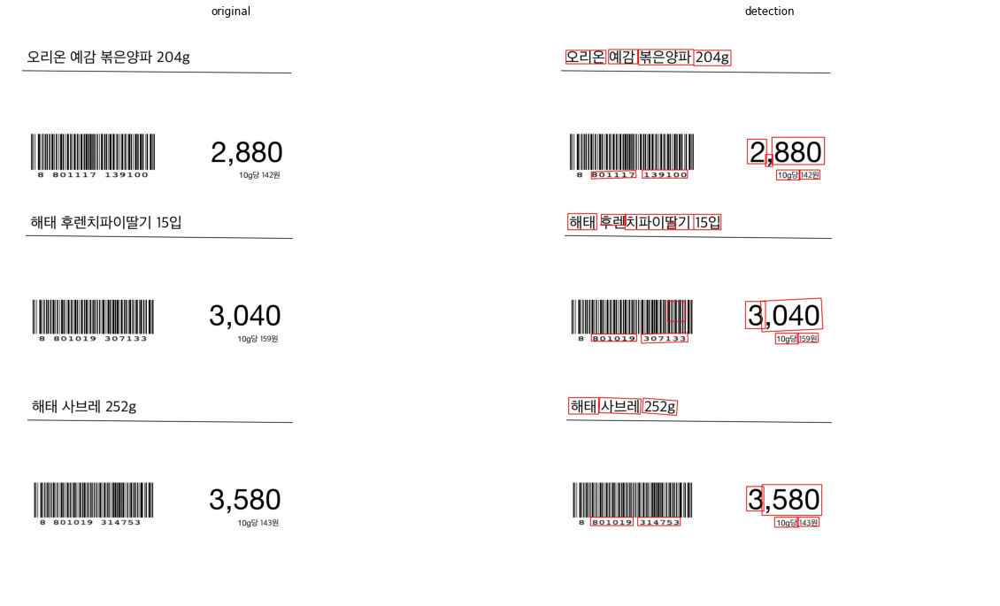

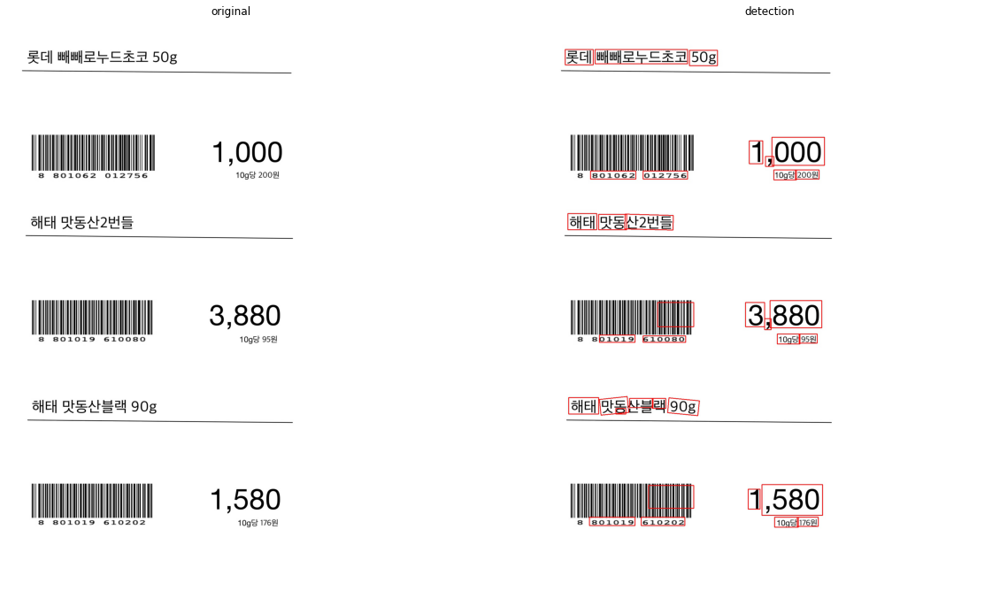

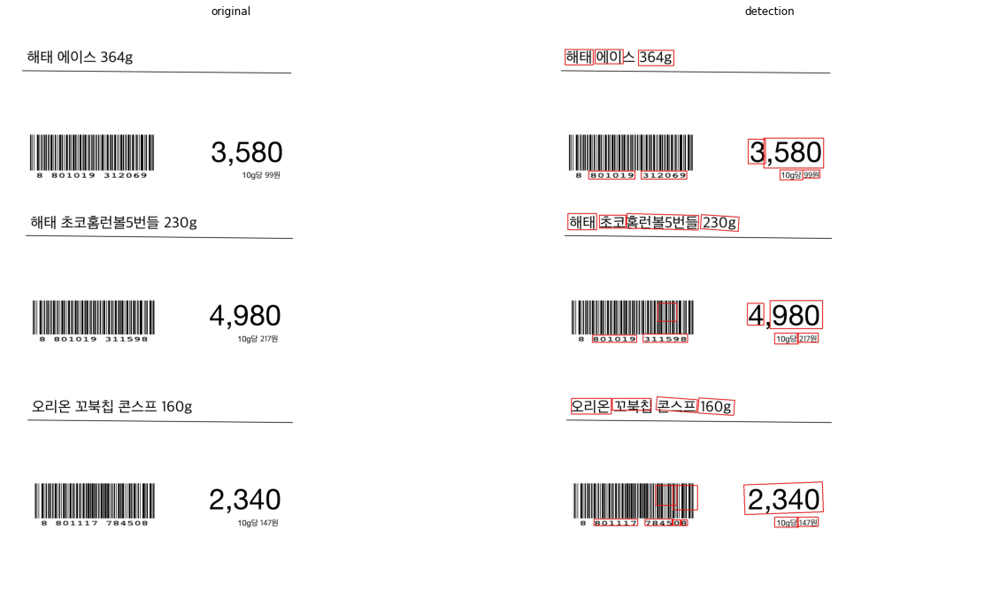

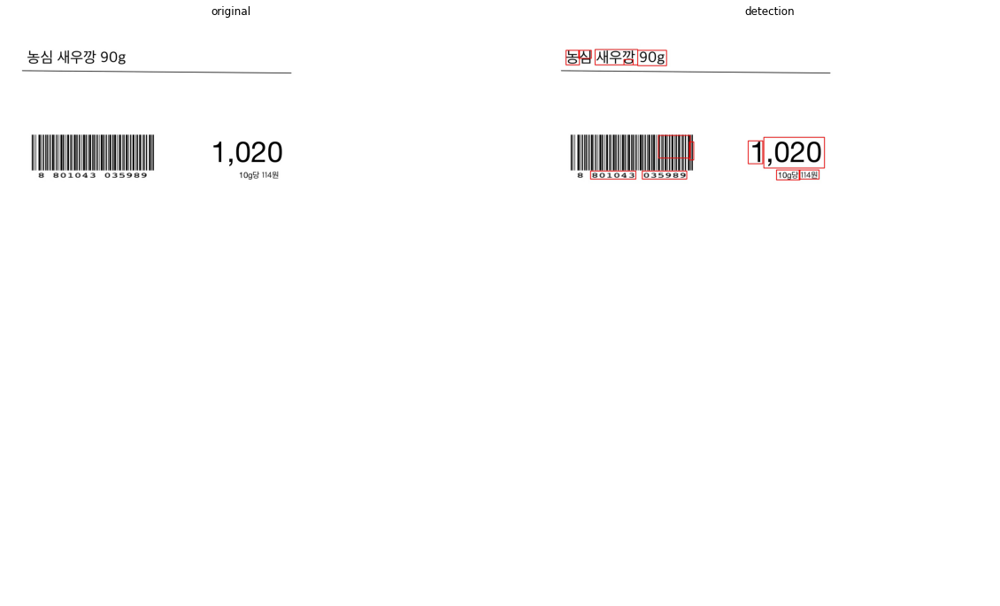

In [ ]:
import cv2
from matplotlib import pyplot as plt
import matplotlib.image as mpimg


# create figure


for img in os.listdir("craft-test-images"):
    fig = plt.figure(figsize=(20, 14))
    rows = 1
    columns = 2
    Image1 = cv2.imread(f'craft-test-images/{img}')
    Image2 = mpimg.imread(f'result/res_{img}'.replace('jpeg','jpg').replace('png', 'jpg'))
    fig.add_subplot(rows, columns, 1)
    plt.imshow(Image1)
    plt.axis('off')
    plt.title("original")
    fig.add_subplot(rows, columns, 2)
    plt.imshow(Image2)
    plt.axis('off')
    plt.title("detection")
    plt.show()

In [ ]:
# 자체적으로 생성한 바코드 아래 코드 / 가격표의 경우 띄어쓰기 단위로 꽤 잘 인식하는 것으로 보임.
# 인식의 정확도가 단순히 가깝고 멀고의 문제는 아닌 것처럼 보임.
# 자체적으로 생성한 가격표로 객체 인식 train / text-detection / text-reocognition train 및 테스트 진행하기.